# IBM Data Science Capstone Project: London Amazon Pharmacies

## Commercial real estate insights for Amazon's new pharmacy initiative in London

### Introduction

<p>During the COVID19 pandemic, a number of commercial venues have foreclosed due to the economic downturn from the lockdowns in London.</p>
<p>Given that London's commercial real estate market is extremely expensive, the recent foreclosures represent a unique buying opportunity in London.</p>
<p>Amazon has recently launched their online Amazon Pharmacy in the US on 17th November 2020 and have also secured their patent to operate in the UK this year. This online pharmacy allows consumers to purchase prescriptions on an online marketplace and get it delivered to their address, without ever having to leave their home. This is a highly disruptive move against the brick and mortar pharmacy market.</p>
    <br> 
<p>However, unlike industries such as electronics or books, many pharmacies don't have the luxury of serving a mass market. Prescription orders are often smaller, more individualized, and more last-minute in nature than in other industries. Moreover, professionals working in the pharmacies can't as readily predict exactly when or where their materials will be needed.</p> <p>As a result, Amazon needs fulfillment centers that allow them to fulfill these less predictable smaller orders in an efficient and agile manner. Compared to their larger fulfillment centers, which deal with industries that have larger and more predictable volumes.</p>
   <br> 
  <p>Therefore, this is a opportunistic time for Amazon to move into London's commercial real estate market, under the assumption that prices should now be a lot lower than before the COVID19 pandemic, in order to build these more agile fulfillment centers closer to their consumers. This will allow them to offer a leap in value over the existing brick and mortar pharmacies within the city center.</p>

### Business Problem

<p>Amazon has now decided to buy commercial real estate to build their online pharmacy fulfillment centers. But, the problem is an exercise in cost-effectiveness. As we know, London's real estate market is extremely expensive.</p> <br><p>Therefore, they would like some insight into the following:</p>
<ul>
    <li>What is the optimal number of fulfillment centers they should start with?</li>
    <li>What are the specific locations they should target to place their fulfillment centers?</li>
    <li>What is the amount of consumers they can expect to serve within a specific location?</li>
       </ul>
    
    
    
    

### Analytic Approach

<p> 1) The analytical approach to solving this problem would involve generating and visualising geospatial data using Geocoder and Folium. Using K-means clustering with the elbow method on geospatial data to find insights.</p>
<p> 2) Linear regression and as well as statistics will be used to evaluate the time series data.</p>

### Data requirements

The data we require to generate these insights are listed below:


<h4> Foursquare location data API</h4>
<p> This problem will be solved using the Foursquare location data API.</p>
<p>The specific data which will be used from the Foursquare API is:</p>
<ul>
    <li>Venue location data</li>
    </ul>
   
<h4> London data store</h4>
   <h5>Commercial and Industrial Floorspace, Borough - Average rateable value of retail space</h5>
   <p>Provided by the UK Valuation Office Agency.</p>
   <p> Found here: https://data.london.gov.uk/dataset/commercial-and-industrial-floorspace-borough</p>
   <br>
   <h5> Number and Density of Dwellings by Borough - Density of residents per borough</h5>
   <p>Provided by the UK Ministry of Housing, Communities & Local Government.</p>
   <p> Found here: https://data.london.gov.uk/dataset/number-and-density-of-dwellings-by-borough</p>
   <br>
   <h5> Vacant Dwellings - Vacant dwellings per borough</h5>
   <p>Provided by the UK Ministry of Housing, Communities & Local Government.</p>
   <p>Found here: https://data.london.gov.uk/dataset/vacant-dwellings</p>
   
<h3>Caveat</h3>
<p> As this is a capstone project, the data used in this notebook will only be limited to data available freely on the internet.</p>
<p> The limit on API calls for the Foursquare API means that this project will not be granular and go deep into the postcodes and individual neighbourhoods of London, but rather focus on the bigger picture. Therefore, the focus here will be on the Boroughs of London as a whole.</p>
    
<p>However, if access to more datasets become available, there is scope for further work on this project. This will be discussed in the further work section after the conclusion of this report.</p>

<p>Exploring the time series of each borough is out of the scope of this project. This analysis will only include the broad trend in London. However, for further granularity, a data exploration can be carried out for each borough separately to determine relationships. For the purposes of this project, the data will be normalized and averaged to give a broad general trend.</p>

<h3>Data Collection & Cleaning</h3>
<p>Before we get the data and start exploring it, let's download all the dependencies that we will need.</p>

In [1]:
import numpy as np # library to handle data in a vectorized manner
import pandas as pd # library for data analsysis
!pip install seaborn
import seaborn as sns
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
import json # library to handle JSON files
!pip install geopy
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values
import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib as mpl
import matplotlib.pyplot as plt
# import k-means from clustering stage
from sklearn.cluster import KMeans
from sklearn.datasets.samples_generator import make_blobs
from sklearn import linear_model
from sklearn import preprocessing, cluster
from folium.plugins import MarkerCluster
import scipy
from sklearn.metrics import r2_score
!pip install folium
import folium # map rendering library
from bs4 import BeautifulSoup
import lxml
print('Libraries imported.')

C:\Users\Asus\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:143: FutureWarning: The sklearn.datasets.samples_generator module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.datasets. Anything that cannot be imported from sklearn.datasets is now part of the private API.
  warnings.warn(message, FutureWarning)


Libraries imported.


<h4>Download</h4>

In [2]:
# Average rateable value of retail space
lonfloor = pd.read_excel('https://data.london.gov.uk/download/commercial-and-industrial-floorspace-borough/874e90c6-58ff-4168-be0f-f0bfca8a76f2/business-floorspace-rateable-value-borough.xls', sheet_name=4)

In [3]:
# Density of dwellings
densitydwell = pd.read_excel('https://data.london.gov.uk/download/number-and-density-of-dwellings-by-borough/dbdfc0b4-ae9f-4c58-a228-79d05c3a1c8e/Number_and_density_of_dwellings_by_borough.xlsx', sheet_name=2)

In [4]:
# Vacant dwellings
vacdwell = pd.read_excel('https://data.london.gov.uk/download/vacant-dwellings/c428a18b-9961-4b98-9cfe-b7f120114141/vacant-dwellings-borough.xlsx', sheet_name=1)

<h4>Data cleaning</h4>
<p> Data downloaded from multiple sources were put into their own table. There were some empty and unnecessary values from different sheets and rows. I decided to only keep the individual borough data for all available years so each data set will be consistent with the others, and be combined later.</p>
<p> There were several problems with the data sets. First, there were different available years for each time set. For example, for 2000 to 2012 for rateable value and 2004 to 2019 for density of dwellings. I decided to use all the available data even though they differed. Therefore, all columns for years were kept.</p>
<p> Second, there were no up to date values for 2020 or estimates for 2021. Therefore, I came up with the conclusion that we would need to predict these values with a machine learning algorithm with the data available. I would then normalise and get a mean of all available values, as some data would differ significantly for example, the gaps between 2012 and 2019.</p>
<p> Third, there was no data available for postcodes, only the boroughs. This meant that all data must remain consistent for boroughs only, therefore the granularity of the project must be limited to boroughs and not individual neighbourhoods. After checking through, there were no postcode related data, so no further work was require here.</p>
<p>Fourth, the datasets are excel based sheets, and came with several different sheets within the excel. For example, vacant dwellings under different jurisdictions, floorspace measured in hectares and rates for different types commerical properties such as retail, offices and industrial. I removed all sheets except for the most relevant data such as retail only, with density of dwellings. I tried to keep the most condensed data and getting rid of the unnecessary values.</p>

<p>After fixing these problems, I checked for NaN values and there were none. There were also no outliers.</p>

<p> After data cleaning, there were 33 samples and 23 features in the data. However, it was clear that values for 2021 will need to be estimated using a machine learning algorithm. The values before 2021 are somewhat redundant as we are looking for the most up to date data. After the values for 2021 are found, the data sets can be combined onto the geospatial data set and the rest of the years before 2021 could be removed.</p>

<p>The Foursquare data found 6657 venues with 4 features.</p>

In [5]:
# Average rateable value of retail space
lonfloor.head()

,Unnamed: 0,"RV per metre2, £/m2",Retail,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13,Unnamed: 14,Unnamed: 15,Offices,Unnamed: 17,Unnamed: 18,Unnamed: 19,Unnamed: 20,Unnamed: 21,Unnamed: 22,Unnamed: 23,Unnamed: 24,Unnamed: 25,Unnamed: 26,Unnamed: 27,£/m2,Unnamed: 29,Industrial,Unnamed: 31,Unnamed: 32,Unnamed: 33,Unnamed: 34,Unnamed: 35,Unnamed: 36,Unnamed: 37,Unnamed: 38,Unnamed: 39,Unnamed: 40,Unnamed: 41,Unnamed: 42,Unnamed: 43,Other,Unnamed: 45,Unnamed: 46,Unnamed: 47,Unnamed: 48,Unnamed: 49,Unnamed: 50,Unnamed: 51,Unnamed: 52,Unnamed: 53,Unnamed: 54,Unnamed: 55,£/m2.1
0,Area Code,Area,2000.0,2001.0,2002.0,2003.0,2004.0,2005.0,2006.0,2007.0,2008.0,2009.0,2010.0,2011.0,2012.0,NaN,2000.0,2001.0,2002.0,2003.0,2004.0,2005.0,2006.0,2007.0,2008.0,2009.0,2010.0,2011.0,2012.0,NaN,2000.0,2001.0,2002.0,2003.0,2004.0,2005.0,2006.0,2007.0,2008.0,2009.0,2010.0,2011.0,2012.0,NaN,2000.0,2001.0,2002.0,2003.0,2004.0,2005.0,2006.0,2007.0,2008.0,2009.0,2010.0,2011.0,2012.0
1,E09000001,City of London,330.0,353.0,340.0,331.0,320.0,460.0,463.0,447.0,420.0,417.0,509.0,509.0,523.0,NaN,282.0,292.0,288.0,288.0,279.0,296.0,297.0,288.0,255.0,249.0,299.0,300.0,301.0,NaN,68.0,68.0,70.0,66.0,65.0,89.0,89.0,85.0,81.0,77.0,89.0,87.0,85.0,NaN,113.0,115.0,121.0,124.0,123.0,165.0,165.0,164.0,163.0,161.0,152.0,152.0,151.0
2,E09000002,Barking and Dagenham,84.0,84.0,84.0,85.0,85.0,103.0,103.0,105.0,103.0,103.0,137.0,139.0,137.0,NaN,75.0,74.0,69.0,75.0,74.0,82.0,82.0,82.0,82.0,83.0,104.0,103.0,105.0,NaN,37.0,38.0,38.0,40.0,42.0,47.0,47.0,48.0,48.0,48.0,54.0,54.0,54.0,NaN,62.0,64.0,63.0,62.0,61.0,71.0,71.0,72.0,74.0,73.0,80.0,82.0,83.0
3,E09000003,Barnet,152.0,151.0,149.0,149.0,148.0,181.0,182.0,184.0,184.0,183.0,239.0,240.0,241.0,NaN,93.0,92.0,90.0,83.0,84.0,105.0,107.0,106.0,106.0,107.0,116.0,118.0,118.0,NaN,56.0,57.0,58.0,51.0,50.0,56.0,55.0,54.0,55.0,55.0,67.0,66.0,66.0,NaN,78.0,87.0,89.0,94.0,94.0,109.0,108.0,113.0,113.0,112.0,120.0,120.0,121.0
4,E09000004,Bexley,97.0,97.0,98.0,96.0,96.0,118.0,117.0,116.0,116.0,116.0,137.0,139.0,143.0,NaN,94.0,92.0,88.0,87.0,85.0,91.0,91.0,94.0,93.0,93.0,85.0,85.0,83.0,NaN,39.0,39.0,41.0,40.0,40.0,47.0,49.0,48.0,49.0,48.0,55.0,56.0,56.0,NaN,67.0,67.0,67.0,65.0,64.0,74.0,75.0,74.0,73.0,73.0,76.0,76.0,77.0


In [6]:
cols = [0,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56]
lonfloor.drop(lonfloor.columns[cols],axis=1,inplace=True)
lonfloor.head()

,"RV per metre2, £/m2",Retail,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13,Unnamed: 14
0,Area,2000.0,2001.0,2002.0,2003.0,2004.0,2005.0,2006.0,2007.0,2008.0,2009.0,2010.0,2011.0,2012.0
1,City of London,330.0,353.0,340.0,331.0,320.0,460.0,463.0,447.0,420.0,417.0,509.0,509.0,523.0
2,Barking and Dagenham,84.0,84.0,84.0,85.0,85.0,103.0,103.0,105.0,103.0,103.0,137.0,139.0,137.0
3,Barnet,152.0,151.0,149.0,149.0,148.0,181.0,182.0,184.0,184.0,183.0,239.0,240.0,241.0
4,Bexley,97.0,97.0,98.0,96.0,96.0,118.0,117.0,116.0,116.0,116.0,137.0,139.0,143.0


In [7]:
lonfloor.columns = lonfloor.iloc[0]
lonfloor = lonfloor.drop(lonfloor.index[0])

In [8]:
lonfloor.head()
lonfloor.isnull().values.any()

True

In [9]:
lonfloor.dropna(axis=0, inplace=True)
lonfloor.isnull().values.any()

False

In [10]:
lonfloor = lonfloor.truncate(before=0, after=33, axis='index')
lonfloor.head()

,Area,2000.0,2001.0,2002.0,2003.0,2004.0,2005.0,2006.0,2007.0,2008.0,2009.0,2010.0,2011.0,2012.0
1,City of London,330.0,353.0,340.0,331.0,320.0,460.0,463.0,447.0,420.0,417.0,509.0,509.0,523.0
2,Barking and Dagenham,84.0,84.0,84.0,85.0,85.0,103.0,103.0,105.0,103.0,103.0,137.0,139.0,137.0
3,Barnet,152.0,151.0,149.0,149.0,148.0,181.0,182.0,184.0,184.0,183.0,239.0,240.0,241.0
4,Bexley,97.0,97.0,98.0,96.0,96.0,118.0,117.0,116.0,116.0,116.0,137.0,139.0,143.0
5,Brent,97.0,98.0,97.0,96.0,95.0,122.0,124.0,127.0,127.0,128.0,162.0,161.0,160.0


In [11]:
lonfloor.set_axis(['Borough', '2000', '2001', '2002','2003','2004','2005','2006','2007','2008','2009','2010','2011','2012'], axis=1, inplace=True)

In [12]:
lonfloor.reset_index(drop=True, inplace=True)

In [13]:
lonfloor.head()
lonfloor.dtypes


Borough     object
2000       float64
2001       float64
2002       float64
2003       float64
2004       float64
2005       float64
2006       float64
2007       float64
2008       float64
2009       float64
2010       float64
2011       float64
2012       float64
dtype: object

In [14]:
lonfloor = lonfloor.applymap(str)
lonfloor = lonfloor.astype('string')
lonfloor.round(decimals=0)

,Borough,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012
0,City of London,330.0,353.0,340.0,331.0,320.0,460.0,463.0,447.0,420.0,417.0,509.0,509.0,523.0
1,Barking and Dagenham,84.0,84.0,84.0,85.0,85.0,103.0,103.0,105.0,103.0,103.0,137.0,139.0,137.0
2,Barnet,152.0,151.0,149.0,149.0,148.0,181.0,182.0,184.0,184.0,183.0,239.0,240.0,241.0
3,Bexley,97.0,97.0,98.0,96.0,96.0,118.0,117.0,116.0,116.0,116.0,137.0,139.0,143.0
4,Brent,97.0,98.0,97.0,96.0,95.0,122.0,124.0,127.0,127.0,128.0,162.0,161.0,160.0
5,Bromley,124.0,125.0,122.0,119.0,119.0,147.0,148.0,150.0,149.0,150.0,162.0,162.0,161.0
6,Camden,166.0,169.0,169.0,167.0,167.0,221.0,222.0,219.0,218.0,218.0,306.0,307.0,311.0
7,Croydon,109.0,110.0,110.0,107.0,107.0,132.0,133.0,133.0,131.0,132.0,148.0,149.0,147.0
8,Ealing,125.0,124.0,121.0,121.0,121.0,157.0,159.0,157.0,156.0,156.0,177.0,177.0,177.0
9,Enfield,109.0,109.0,108.0,107.0,107.0,137.0,138.0,139.0,139.0,137.0,167.0,167.0,167.0


In [15]:
# Density of dwellings
densitydwell.dropna(axis=0, inplace=True)
lonfloor.isnull().values.any()
densitydwell.drop(columns=['ONS code'], inplace=True)
densitydwell.rename(columns={'Area name':'Borough','Total Area (Hectares)':'Total m2'}, inplace=True)
densitydwell['Total m2'] = densitydwell['Total m2']*10000
densitydwell.iloc[: , [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]] = (densitydwell.iloc[: , [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]])/10000
densitydwell.reset_index(drop=True, inplace=True)
densitydwell['Total m2'].round(decimals=0)
densitydwell.iloc[: , [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]].round(decimals=5)
densitydwell = densitydwell.applymap(str).astype('string')

In [16]:
# Vacant dwellings
vacdwell = vacdwell.iloc[: ,[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]]
vacdwell = vacdwell.drop([0,1,35,36,37,38,39,40,41])

In [17]:
vacdwell.applymap(str).astype('string')
vacdwell['All Vacant Dwellings'].replace('..','0', inplace=True)

In [18]:
vacdwell.head()

,Area,All Vacant Dwellings,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13,Unnamed: 14,Unnamed: 15,Unnamed: 16,Unnamed: 17
2,City of London,165,123.0,93.0,122.0,98.0,72.0,131.0,88.0,89.0,107,120,86,124,252,321,311
3,Barking and Dagenham,1623,1906.0,2477.0,2064.0,1650.0,1643.0,1570.0,1578.0,1631.0,1484,1382,1154,752,822,998,921
4,Barnet,3607,3767.0,3486.0,3320.0,4036.0,3652.0,3679.0,3201.0,3016.0,2549,2362,2638,2199,2302,2367,2944
5,Bexley,2161,2157.0,2309.0,2247.0,2123.0,2059.0,1755.0,1971.0,2282.0,1271,1087,1180,1249,1469,1623,1668
6,Brent,3568,2764.0,2482.0,2736.0,2271.0,2268.0,2350.0,2370.0,2328.0,1130,1181,1073,968,1103,1126,1662


In [19]:
vacdwell.columns = ['Borough','2004','2005','2006','2007','2008','2009','2010','2011','2012','2013','2014','2015','2016','2017','2018','2019']

In [20]:
vacdwell.reset_index(drop=True, inplace=True)

<h4>Wrangle</h4>

In [21]:
vacdwell = vacdwell.applymap(str).astype('string')
vacdwell.head()

,Borough,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
0,City of London,165,123.0,93.0,122.0,98.0,72.0,131.0,88.0,89.0,107,120,86,124,252,321,311
1,Barking and Dagenham,1623,1906.0,2477.0,2064.0,1650.0,1643.0,1570.0,1578.0,1631.0,1484,1382,1154,752,822,998,921
2,Barnet,3607,3767.0,3486.0,3320.0,4036.0,3652.0,3679.0,3201.0,3016.0,2549,2362,2638,2199,2302,2367,2944
3,Bexley,2161,2157.0,2309.0,2247.0,2123.0,2059.0,1755.0,1971.0,2282.0,1271,1087,1180,1249,1469,1623,1668
4,Brent,3568,2764.0,2482.0,2736.0,2271.0,2268.0,2350.0,2370.0,2328.0,1130,1181,1073,968,1103,1126,1662


In [22]:
densitydwell.head()

,Borough,Total m2,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
0,City of London,3149383.0000000005,0.001590470260365284,0.0016247944438640839,0.0016276838987192093,0.0016712162350530247,0.001706492986086481,0.001706207215826084,0.0017065564905887915,0.0017211942783713506,0.00173583206615391,0.0017333236383126468,0.0017505016061876244,0.0017562170113955653,0.0017673302992998944,0.0019060876368482333,0.001977847724459045,0.002002296957848569,0.002004519615429435,0.00204833772202365,0.0020658014601590215
1,Barking and Dagenham,37799330.0,0.0018068574231342198,0.0018128813394311487,0.001821127517339593,0.001822759821404242,0.0018323287740814455,0.001839410910193382,0.0018475248106249503,0.0018664590086649683,0.0018740702546844088,0.0018769195115363158,0.0018804301557726025,0.0018897424901446666,0.001903128970804509,0.0019224679379237675,0.0019360660625466113,0.001955431485161245,0.0019711989604048537,0.001982125079994804,0.0020060937588047196
2,Barnet,86748314.00000001,0.0015045249179136781,0.00150781720091989,0.0015202969823713232,0.001531508727650891,0.001543573515446075,0.0015555460824287603,0.0015611669409505756,0.0015755948870660472,0.0015881438341268507,0.001597914629211122,0.0016063251673110327,0.0016307019578689285,0.0016465408824156349,0.0016593711029545609,0.0016746336474231488,0.0016914408905010947,0.0017121790457118116,0.0017376319899615406,0.0017630964618128324
3,Bexley,64285879.00000001,0.0014249785711104611,0.0014296701146452396,0.001434579435399802,0.0014458820731065992,0.0014500913956547127,0.001453398498292292,0.0014582611524997582,0.0014634349170212014,0.00146798646091469,0.0014746379994275258,0.0014783495454732756,0.0014815073151601458,0.0014880095207222724,0.0014962228330112743,0.0015088228007273572,0.0015067694726551065,0.0015186538866490413,0.0015229627644976278,0.0015305227451272775
4,Brent,43232637.00000001,0.002346074795298746,0.002378483181583395,0.0024020325200149136,0.0024160982824156666,0.0024308810956870383,0.002469604155767782,0.002497409538076523,0.0025220922794970844,0.0025500133151720537,0.0025770785159369295,0.0025925552494056744,0.002605508426423306,0.002620820932112006,0.002637798846274401,0.0026738595658645573,0.002698169903445862,0.0027297201417530925,0.002745772828985657,0.002786043331106543


In [23]:
lonfloor.head()

,Borough,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012
0,City of London,330.0,353.0,340.0,331.0,320.0,460.0,463.0,447.0,420.0,417.0,509.0,509.0,523.0
1,Barking and Dagenham,84.0,84.0,84.0,85.0,85.0,103.0,103.0,105.0,103.0,103.0,137.0,139.0,137.0
2,Barnet,152.0,151.0,149.0,149.0,148.0,181.0,182.0,184.0,184.0,183.0,239.0,240.0,241.0
3,Bexley,97.0,97.0,98.0,96.0,96.0,118.0,117.0,116.0,116.0,116.0,137.0,139.0,143.0
4,Brent,97.0,98.0,97.0,96.0,95.0,122.0,124.0,127.0,127.0,128.0,162.0,161.0,160.0


In [24]:
lonpostcode = pd.DataFrame(data=lonfloor['Borough'], columns=['Borough'])

In [25]:
lonpostcode

,Borough
0,City of London
1,Barking and Dagenham
2,Barnet
3,Bexley
4,Brent
5,Bromley
6,Camden
7,Croydon
8,Ealing
9,Enfield


In [26]:
totalm2 = densitydwell[['Borough','Total m2']].set_index('Borough')

In [27]:
dflon = lonpostcode.join(totalm2, on='Borough')


In [28]:
dflon = dflon.applymap(str).astype('string')

<h3>Data Understanding</h3>

<p>There are two types of data sets. One data set is fixed data such as the location of boroughs, coordinates, locations of venues and the total areas (m2) of the boroughs. </p><p>The other data set is time series such as vacant dwellings per m2 (2004 - 2019), dwellings per m2 (2001 - 2019) and rateable value of retail space per m2 (2000 - 2012).</p><br><p> We are interested in insights for purchasing retail locations in 2021 onwards, so ideally we need to predict the time series data for 2021.</p><p>We will first try to do some data exploration on these time series data sets to see if any sort of relationship is visible. If we do find a relationship, we can then use machine learning to predict values for 2021. </p>

<h4> Scatter plots to understand the time series data.</h4>
<h5> Vacant Dwelling Time Series</h5>
<p> This section explores the changes in vacant dwellings in London as a whole over time. We will use scatter plots and statistical analysis to find if there is any correlation.</p>

In [29]:
vacdwellfloat = vacdwell.iloc[:, 1:17].astype('float')

In [30]:
#Normalize
vacx = vacdwellfloat.values
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(vacx)
vacdwellfloatnormal = pd.DataFrame(x_scaled)
vacdwellfloatnormal.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
0,0.035507,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.349258,0.419233,0.523956,0.494022,0.381702,0.380295,0.345997,0.405884,0.438442,0.502738,0.460752,0.232629,0.127720,0.100141,0.105124,0.101802
2,0.776200,0.856807,0.745714,0.813533,0.968519,0.866618,0.853090,0.847998,0.832243,0.891566,0.818547,0.555870,0.422005,0.360155,0.317702,0.439419
3,0.465031,0.478251,0.487033,0.540575,0.498032,0.480997,0.390478,0.512939,0.623543,0.424973,0.353049,0.238292,0.228798,0.213809,0.202174,0.226469
4,0.767807,0.620973,0.525055,0.664971,0.534432,0.531590,0.533542,0.621629,0.636622,0.373494,0.387368,0.214986,0.171649,0.149508,0.125000,0.225467


In [31]:
#Mean yearly values
vacdwellfloatnormal.loc['Yearly_Mean']= vacdwellfloatnormal.mean(numeric_only=True, axis=0)

In [32]:
vactest = vacdwellfloatnormal.drop(vacdwellfloatnormal.index[0:33],0,inplace=False)
vactest.columns = ['2004','2005','2006','2007','2008','2009','2010','2011','2012','2013','2014','2015','2016','2017','2018','2019']

In [33]:
vactest1 = vactest.transpose()

In [34]:
vactest1.reset_index(inplace=True)

In [35]:
vactest1.columns = ['year','mean1']
vactest1

,year,mean1
0,2004,0.565585
1,2005,0.580781
2,2006,0.556990
3,2007,0.621332
4,2008,0.602871
5,2009,0.606545
6,2010,0.551181
7,2011,0.589436
8,2012,0.595928
9,2013,0.617146


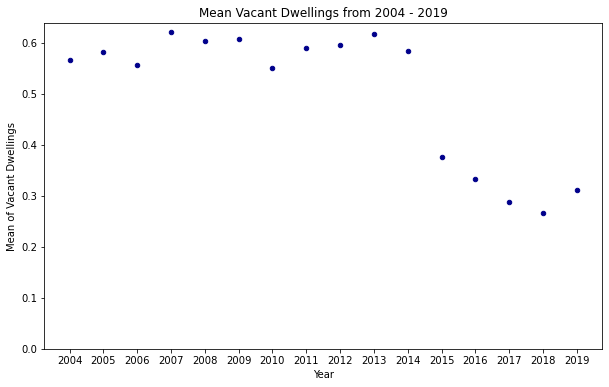

In [36]:
vactest1.plot(kind='scatter', x='year', y='mean1', figsize=(10,6), color='darkblue')
plt.title('Mean Vacant Dwellings from 2004 - 2019')
plt.xlabel('Year')
plt.ylabel('Mean of Vacant Dwellings')
plt.ylim(0,)
plt.show()

,year,mean1
year,1.000000,-0.781182
mean1,-0.781182,1.000000


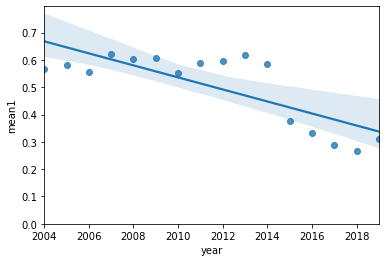

In [37]:
#Check Correlation for linearity
vactest1['year'] = pd.to_numeric(vactest1['year'], downcast='float')
sns.regplot(x='year', y='mean1', data=vactest1)
plt.ylim(0,)
vactest1[['year', 'mean1']].corr()


<p> From the data available, there seems to be a moderately correlated negative linear relationship between year and the amount of vacant dwellings. We can say that as time passes, the number of vacant dwellings decreases in general.</p>
<p> We can see there is a general decline in vacant dwellings from 2004 to 2013. From 2013 onwards, there is a sharp decline in vacant dwellings until 2018. Fro 2018 onwards, there seems to be small increase in vacant dwellings.</p> <p> From the Great Financial Crisis (GFC) in 2008, we know that interest rates were progressively cut over the following years. Together with interest rate cuts and quantitative easing from the Central banks, mortgages were made more attractive to home buyers. It is possible that this is reflected in the graph above as we can see a general declining trend in vacant dwellings over the years.</p>
<p> With the current COVID crisis, the narrative is that the lockdowns will result in an economic downturn far worse than the GFC in 2008. This year we have already seen the Central banks further cut interest rates to the lowest they have ever been in history coupled with infinite amounts of QE and stimulus packages. Therefore, we can assume that mortgages will become even more attractive for home buyers, and this general declining trend in vacant dwellings will continue.</p>
<p>Therefore, we will use a simple linear regression as our machine learning model to predict vacant dwelling values for 2021.</p>

<h5> Density of Dwellings Time Series</h5>
<p> This section explores the changes in the density of dwellings in London as a whole over time. We will use scatter plots and statistical analysis to find if there is any correlation.</p>

In [38]:
densitydwell.head()

,Borough,Total m2,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
0,City of London,3149383.0000000005,0.001590470260365284,0.0016247944438640839,0.0016276838987192093,0.0016712162350530247,0.001706492986086481,0.001706207215826084,0.0017065564905887915,0.0017211942783713506,0.00173583206615391,0.0017333236383126468,0.0017505016061876244,0.0017562170113955653,0.0017673302992998944,0.0019060876368482333,0.001977847724459045,0.002002296957848569,0.002004519615429435,0.00204833772202365,0.0020658014601590215
1,Barking and Dagenham,37799330.0,0.0018068574231342198,0.0018128813394311487,0.001821127517339593,0.001822759821404242,0.0018323287740814455,0.001839410910193382,0.0018475248106249503,0.0018664590086649683,0.0018740702546844088,0.0018769195115363158,0.0018804301557726025,0.0018897424901446666,0.001903128970804509,0.0019224679379237675,0.0019360660625466113,0.001955431485161245,0.0019711989604048537,0.001982125079994804,0.0020060937588047196
2,Barnet,86748314.00000001,0.0015045249179136781,0.00150781720091989,0.0015202969823713232,0.001531508727650891,0.001543573515446075,0.0015555460824287603,0.0015611669409505756,0.0015755948870660472,0.0015881438341268507,0.001597914629211122,0.0016063251673110327,0.0016307019578689285,0.0016465408824156349,0.0016593711029545609,0.0016746336474231488,0.0016914408905010947,0.0017121790457118116,0.0017376319899615406,0.0017630964618128324
3,Bexley,64285879.00000001,0.0014249785711104611,0.0014296701146452396,0.001434579435399802,0.0014458820731065992,0.0014500913956547127,0.001453398498292292,0.0014582611524997582,0.0014634349170212014,0.00146798646091469,0.0014746379994275258,0.0014783495454732756,0.0014815073151601458,0.0014880095207222724,0.0014962228330112743,0.0015088228007273572,0.0015067694726551065,0.0015186538866490413,0.0015229627644976278,0.0015305227451272775
4,Brent,43232637.00000001,0.002346074795298746,0.002378483181583395,0.0024020325200149136,0.0024160982824156666,0.0024308810956870383,0.002469604155767782,0.002497409538076523,0.0025220922794970844,0.0025500133151720537,0.0025770785159369295,0.0025925552494056744,0.002605508426423306,0.002620820932112006,0.002637798846274401,0.0026738595658645573,0.002698169903445862,0.0027297201417530925,0.002745772828985657,0.002786043331106543


In [39]:
densitydwellfloat = densitydwell.iloc[:, 2:21].astype('float')

In [40]:
#Normalize
dendx = densitydwellfloat.values
min_max_scaler = preprocessing.MinMaxScaler()
dendx_scaled = min_max_scaler.fit_transform(dendx)
densitydwellfloatnormal = pd.DataFrame(dendx_scaled)

In [41]:
#Mean yearly values
densitydwellfloatnormal.loc['Yearly_Mean']= densitydwellfloatnormal.mean(numeric_only=True, axis=0)

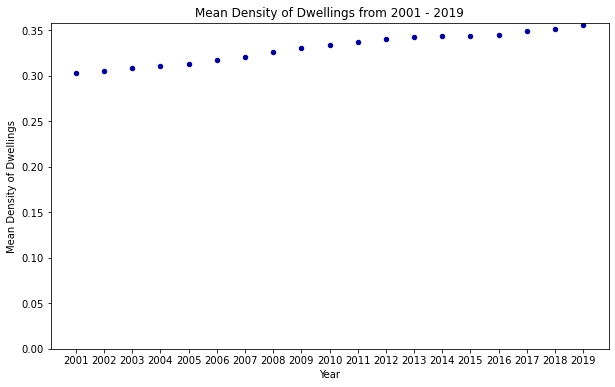

In [42]:
dentest = densitydwellfloatnormal.drop(densitydwellfloatnormal.index[0:33],0,inplace=False)
dentest.columns = ['2001','2002','2003','2004','2005','2006','2007','2008','2009','2010','2011','2012','2013','2014','2015','2016','2017','2018','2019']
dentest1 = dentest.transpose()
dentest1.reset_index(inplace=True)
dentest1.columns = ['year','mean']

dentest1.plot(kind='scatter', x='year', y='mean', figsize=(10,6), color='darkblue')
plt.title('Mean Density of Dwellings from 2001 - 2019')
plt.xlabel('Year')
plt.ylabel('Mean Density of Dwellings')
plt.ylim(0,)
plt.show()

,year,mean
year,1.000000,0.989434
mean,0.989434,1.000000


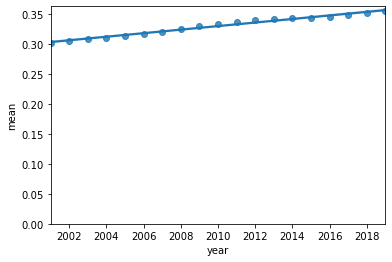

In [43]:
#Check Correlation for linearity
dentest1['year'] = pd.to_numeric(dentest1['year'], downcast='float')
sns.regplot(x='year', y='mean', data=dentest1)
plt.ylim(0,)
dentest1[['year', 'mean']].corr()

<p> From the data available, there seems to be a very highly correlated positive linear relationship between year and the mean of density of dwellings. We can say that as we go into the future, the number of dwellings per borough will increase.</p>
<p>Therefore, we will use a simple linear regression as our machine learning model to predict the density of dwelling values for 2021.</p>

<h5> Average rateable value of retail space</h5>
<p> This section explores the changes in average rateable value of retail space in London as a whole over time. We will use scatter plots and statistical analysis to find if there is any correlation.</p>

In [44]:
lonfloor.head()

,Borough,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012
0,City of London,330.0,353.0,340.0,331.0,320.0,460.0,463.0,447.0,420.0,417.0,509.0,509.0,523.0
1,Barking and Dagenham,84.0,84.0,84.0,85.0,85.0,103.0,103.0,105.0,103.0,103.0,137.0,139.0,137.0
2,Barnet,152.0,151.0,149.0,149.0,148.0,181.0,182.0,184.0,184.0,183.0,239.0,240.0,241.0
3,Bexley,97.0,97.0,98.0,96.0,96.0,118.0,117.0,116.0,116.0,116.0,137.0,139.0,143.0
4,Brent,97.0,98.0,97.0,96.0,95.0,122.0,124.0,127.0,127.0,128.0,162.0,161.0,160.0


In [45]:
lonfloorfloat = lonfloor.iloc[:, 1:14].astype('float')

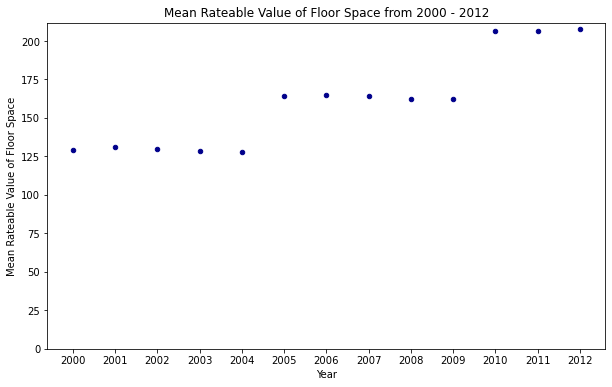

In [46]:
#Mean yearly values
lonfloorfloat.loc['Yearly_Mean']= lonfloorfloat.mean(numeric_only=True, axis=0)
lontest = lonfloorfloat.drop(lonfloorfloat.index[0:33],0,inplace=False)
lontest.columns = ['2000','2001','2002','2003','2004','2005','2006','2007','2008','2009','2010','2011','2012']
lontest1 = lontest.transpose()
lontest1.reset_index(inplace=True)
lontest1.columns = ['year','mean']

lontest1.plot(kind='scatter', x='year', y='mean', figsize=(10,6), color='darkblue')
plt.title('Mean Rateable Value of Floor Space from 2000 - 2012')
plt.xlabel('Year')
plt.ylabel('Mean Rateable Value of Floor Space')
plt.ylim(0,)
plt.show()


,year,mean
year,1.000000,0.920234
mean,0.920234,1.000000


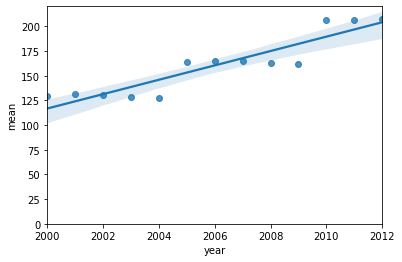

In [47]:
#Check Correlation for linearity
lontest1['year'] = pd.to_numeric(lontest1['year'], downcast='float')
sns.regplot(x='year', y='mean', data=lontest1)
plt.ylim(0,)
lontest1[['year', 'mean']].corr()

<p> From the data available, there seems to be a highly correlated positive linear relationship between year and the mean of rateable value of floor space. We can say that as we go into the future, the floor space value wil increase.</p>
<p>Therefore, we will use a simple linear regression as our machine learning model to predict the value of floorspace for 2021.</p>

<h4>Conclusion from Data Understanding</h4>
<p> We can conclude that for the 3 time series data sets, a linear regression model is able to be used to predict values for 2021. In the next section of this notebook, we will prepare the data for the simple linear regression modelling.</p>
<p>The other fixed data sets will also be prepared here.</p>

<h3> Data Preparation - 1</h3>

<p>For the geospatial data, a Foursquare API was used to find the specific latitudes and longitudes of venues within London. The problems with this was that for free users there is a daily limit of calls you can make, therefore this meant that we cannot get data for all the venues in London. However, I tried to maximise the limits on the API to get as much data as possible.</p>
<p> After retrieving data from the Foursquare API, I was able to get data for 1952 venues, which includes names of venues, latitude and longitude and category of venues.</p>

<h4> Vacant Dwelling Data </h4>

In [48]:
vacdwell.head()

,Borough,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
0,City of London,165,123.0,93.0,122.0,98.0,72.0,131.0,88.0,89.0,107,120,86,124,252,321,311
1,Barking and Dagenham,1623,1906.0,2477.0,2064.0,1650.0,1643.0,1570.0,1578.0,1631.0,1484,1382,1154,752,822,998,921
2,Barnet,3607,3767.0,3486.0,3320.0,4036.0,3652.0,3679.0,3201.0,3016.0,2549,2362,2638,2199,2302,2367,2944
3,Bexley,2161,2157.0,2309.0,2247.0,2123.0,2059.0,1755.0,1971.0,2282.0,1271,1087,1180,1249,1469,1623,1668
4,Brent,3568,2764.0,2482.0,2736.0,2271.0,2268.0,2350.0,2370.0,2328.0,1130,1181,1073,968,1103,1126,1662


<h4> Density of Dwellings Data </h4>

In [49]:
densitydwell.head()

,Borough,Total m2,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
0,City of London,3149383.0000000005,0.001590470260365284,0.0016247944438640839,0.0016276838987192093,0.0016712162350530247,0.001706492986086481,0.001706207215826084,0.0017065564905887915,0.0017211942783713506,0.00173583206615391,0.0017333236383126468,0.0017505016061876244,0.0017562170113955653,0.0017673302992998944,0.0019060876368482333,0.001977847724459045,0.002002296957848569,0.002004519615429435,0.00204833772202365,0.0020658014601590215
1,Barking and Dagenham,37799330.0,0.0018068574231342198,0.0018128813394311487,0.001821127517339593,0.001822759821404242,0.0018323287740814455,0.001839410910193382,0.0018475248106249503,0.0018664590086649683,0.0018740702546844088,0.0018769195115363158,0.0018804301557726025,0.0018897424901446666,0.001903128970804509,0.0019224679379237675,0.0019360660625466113,0.001955431485161245,0.0019711989604048537,0.001982125079994804,0.0020060937588047196
2,Barnet,86748314.00000001,0.0015045249179136781,0.00150781720091989,0.0015202969823713232,0.001531508727650891,0.001543573515446075,0.0015555460824287603,0.0015611669409505756,0.0015755948870660472,0.0015881438341268507,0.001597914629211122,0.0016063251673110327,0.0016307019578689285,0.0016465408824156349,0.0016593711029545609,0.0016746336474231488,0.0016914408905010947,0.0017121790457118116,0.0017376319899615406,0.0017630964618128324
3,Bexley,64285879.00000001,0.0014249785711104611,0.0014296701146452396,0.001434579435399802,0.0014458820731065992,0.0014500913956547127,0.001453398498292292,0.0014582611524997582,0.0014634349170212014,0.00146798646091469,0.0014746379994275258,0.0014783495454732756,0.0014815073151601458,0.0014880095207222724,0.0014962228330112743,0.0015088228007273572,0.0015067694726551065,0.0015186538866490413,0.0015229627644976278,0.0015305227451272775
4,Brent,43232637.00000001,0.002346074795298746,0.002378483181583395,0.0024020325200149136,0.0024160982824156666,0.0024308810956870383,0.002469604155767782,0.002497409538076523,0.0025220922794970844,0.0025500133151720537,0.0025770785159369295,0.0025925552494056744,0.002605508426423306,0.002620820932112006,0.002637798846274401,0.0026738595658645573,0.002698169903445862,0.0027297201417530925,0.002745772828985657,0.002786043331106543


<h4> Rateable Value of Floorspace Data </h4>

In [50]:
lonfloor.head()

,Borough,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012
0,City of London,330.0,353.0,340.0,331.0,320.0,460.0,463.0,447.0,420.0,417.0,509.0,509.0,523.0
1,Barking and Dagenham,84.0,84.0,84.0,85.0,85.0,103.0,103.0,105.0,103.0,103.0,137.0,139.0,137.0
2,Barnet,152.0,151.0,149.0,149.0,148.0,181.0,182.0,184.0,184.0,183.0,239.0,240.0,241.0
3,Bexley,97.0,97.0,98.0,96.0,96.0,118.0,117.0,116.0,116.0,116.0,137.0,139.0,143.0
4,Brent,97.0,98.0,97.0,96.0,95.0,122.0,124.0,127.0,127.0,128.0,162.0,161.0,160.0


<h4> London Neighbourhood Data </h4>

In [51]:
addresslon = 'London'
geolocator = Nominatim(user_agent="lon1_explorer")
locationlon = geolocator.geocode(addresslon)
latitudelon = locationlon.latitude
longitudelon = locationlon.longitude
print('The geograpical coordinate of London are {}, {}.'.format(latitudelon, longitudelon))

The geograpical coordinate of London are 51.5073219, -0.1276474.


In [52]:
dflon.head()

,Borough,Total m2
0,City of London,3149383.0000000005
1,Barking and Dagenham,37799330.0
2,Barnet,86748314.00000001
3,Bexley,64285879.00000001
4,Brent,43232637.00000001


In [53]:
#This is so that the Geocoder library can find non-Nan latitudes and longitudes.
location = [x for x in dflon['Borough']
           if type(x) == str]
latitude = []
longitude =  []
for i in range(0, len(location)):
    # remove things that does not seem usefull here
    try:
        address = location[i] + ', London, UK'
        geolocator = Nominatim(user_agent="lon_explorer")
        loc = geolocator.geocode(address)
        latitude.append(loc.latitude)
        longitude.append(loc.longitude)
        
    except:
        # in the case the geolocator does not work, then add nan element to list
        # to keep the right size
        latitude.append(np.nan)
        longitude.append(np.nan)
# create a dataframe with the location, latitude and longitude
df_1 = pd.DataFrame({'Borough':location, 
                    'Latitude': latitude,
                    'Longitude':longitude})

In [54]:
df_1null = df_1[df_1.isna().any(axis=1)]
df_1null

,Borough,Latitude,Longitude


In [55]:
dflon.head()

,Borough,Total m2
0,City of London,3149383.0000000005
1,Barking and Dagenham,37799330.0
2,Barnet,86748314.00000001
3,Bexley,64285879.00000001
4,Brent,43232637.00000001


In [56]:
df_1.head()

,Borough,Latitude,Longitude
0,City of London,51.515618,-0.091998
1,Barking and Dagenham,51.554117,0.150504
2,Barnet,51.653090,-0.200226
3,Bexley,51.441679,0.150488
4,Brent,51.563826,-0.275760


In [57]:
dflondon = pd.merge(dflon, df_1, on='Borough', right_index=True)

In [58]:
dflondon.head()

,Borough,Total m2,Latitude,Longitude
0,City of London,3149383.0000000005,51.515618,-0.091998
1,Barking and Dagenham,37799330.0,51.554117,0.150504
2,Barnet,86748314.00000001,51.653090,-0.200226
3,Bexley,64285879.00000001,51.441679,0.150488
4,Brent,43232637.00000001,51.563826,-0.275760


<h4> Foursquare Venue Data </h4>

In [59]:
CLIENT_ID = '4HYZFAREENQF0LAOYBSGGYRIDRJL03RI5EU1MSZ0RTNGGNXS' # your Foursquare ID
CLIENT_SECRET = 'QBJICOMCK1EN33GVU5IZWHHHJIG3U0A2USKE50E3HJ4VEW5S' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version
LIMIT = 1000 # A default Foursquare API limit value
radius = 10000
ACCESS_TOKEN = 'RXIHUILHU12ZVUQHU3IUYR5DVSBRVSF5RQRMGVH45ZCCMJ1Y'

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: 4HYZFAREENQF0LAOYBSGGYRIDRJL03RI5EU1MSZ0RTNGGNXS
CLIENT_SECRET:QBJICOMCK1EN33GVU5IZWHHHJIG3U0A2USKE50E3HJ4VEW5S


In [60]:
# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

In [61]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?client_id={}&client_secret={}&ll={},{}&oauth_token={}&v={}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            lat,
            lng, 
            ACCESS_TOKEN, 
            VERSION, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()['response']['groups'][0]['items']
        if len(results) > 0:
        
        # return only relevant information for each nearby venue
         venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Borough', 
                  'Borough Latitude', 
                  'Borough Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [62]:
london_venues = getNearbyVenues(names=dflondon['Borough'],
                                   latitudes=dflondon['Latitude'],
                                   longitudes=dflondon['Longitude']
                                  )

City of London
Barking and Dagenham
Barnet
Bexley
Brent
Bromley
Camden
Croydon
Ealing
Enfield
Greenwich
Hackney
Hammersmith and Fulham
Haringey
Harrow
Havering
Hillingdon
Hounslow
Islington
Kensington and Chelsea
Kingston upon Thames
Lambeth
Lewisham
Merton
Newham
Redbridge
Richmond upon Thames
Southwark
Sutton
Tower Hamlets
Waltham Forest
Wandsworth
Westminster


In [63]:
london_venues.head()

,Borough,Borough Latitude,Borough Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,City of London,51.515618,-0.091998,Hawksmoor Guildhall,51.515498,-0.090849,Steakhouse
1,City of London,51.515618,-0.091998,Goodman Steak House Restaurant,51.514398,-0.090745,Steakhouse
2,City of London,51.515618,-0.091998,Daunt Books,51.513982,-0.092995,Bookstore
3,City of London,51.515618,-0.091998,The Ned Hotel,51.513755,-0.090067,Hotel
4,City of London,51.515618,-0.091998,The Merchant House,51.513264,-0.093039,Cocktail Bar


<h3> Data Modelling & Evaluation - 1</h3>

<h4> Linear Regression on Time series data sets & Accuracy</h4>
<p> In this section, we will carry out linear regression as a machine learning model on the three time series data sets. Linear regression will be used as a predictive algorithm to estimate the future values of each dataset in 2021. It was found that linear regression could be a suitable model to use based on linear correlation found on the scatter plots in the previous section.</p>

<p> These values for 2021 are relevant as Amazon will need estimates for their purchasing decisions in 2021.</p>
<p> The accuracy of the models will also be described using mean absolute error, residual sum of squares and R-squared score.</p>

<h4> Vacant Dwelling Data </h4>

In [64]:
vactest1

,year,mean1
0,2004.0,0.565585
1,2005.0,0.580781
2,2006.0,0.556990
3,2007.0,0.621332
4,2008.0,0.602871
5,2009.0,0.606545
6,2010.0,0.551181
7,2011.0,0.589436
8,2012.0,0.595928
9,2013.0,0.617146


In [65]:
#simple linear regression
msk1 = np.random.rand(len(vactest1)) < 0.8
train1 = vactest1[msk1]
test1 = vactest1[~msk1]

In [66]:
regr = linear_model.LinearRegression()
train_x = np.asanyarray(train1[['year']])
train_y = np.asanyarray(train1[['mean1']])
regr.fit (train_x, train_y)
# The coefficients
print ('Coefficients: ', regr.coef_)
print ('Intercept: ',regr.intercept_)

Coefficients:  [[-0.02241596]]
Intercept:  [45.598312]


Text(0, 0.5, 'Mean')

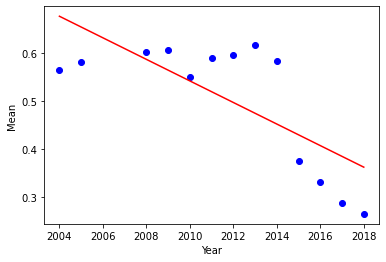

In [67]:
plt.scatter(train1.year, train1.mean1,  color='blue')
plt.plot(train_x, regr.coef_[0][0]*train_x + regr.intercept_[0], '-r')
plt.xlabel("Year")
plt.ylabel("Mean")

In [68]:
y_hat= regr.predict(test1[['mean1']])
x = np.asanyarray(test1[['year']])
y = np.asanyarray(test1[['mean1']])
print("Residual sum of squares: %.2f"
      % np.mean((y_hat - y) ** 2))

# Explained variance score: 1 is perfect prediction
print('Variance score: %.2f' % regr.score(x, y))

Residual sum of squares: 2033.21
Variance score: 0.88


In [69]:
test_x = np.asanyarray(test1[['year']])
test_y = np.asanyarray(test1[['mean1']])
test_y_ = regr.predict(test_x)

print("Mean absolute error: %.2f" % np.mean(np.absolute(test_y_ - test_y)))
print("Residual sum of squares (MSE): %.2f" % np.mean((test_y_ - test_y) ** 2))
print("R2-score: %.2f" % r2_score(test_y , test_y_) )

Mean absolute error: 0.04
Residual sum of squares (MSE): 0.00
R2-score: 0.88


In [70]:
# Coefficient and intercept for predicting vacant dwellings numbers in 2021
vregr = linear_model.LinearRegression()
vacx = np.asanyarray(vactest1[['year']])
vacy = np.asanyarray(vactest1[['mean1']])
vregr.fit (vacx, vacy)
# The coefficients
print ('Coefficients: ', vregr.coef_)
print ('Intercept: ',vregr.intercept_)

vcoef = vregr.coef_
vintercept = vregr.intercept_

Coefficients:  [[-0.02202193]]
Intercept:  [44.799904]


<h4> Density of Dwellings Data </h4>

In [71]:
densitydwell.head()

,Borough,Total m2,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
0,City of London,3149383.0000000005,0.001590470260365284,0.0016247944438640839,0.0016276838987192093,0.0016712162350530247,0.001706492986086481,0.001706207215826084,0.0017065564905887915,0.0017211942783713506,0.00173583206615391,0.0017333236383126468,0.0017505016061876244,0.0017562170113955653,0.0017673302992998944,0.0019060876368482333,0.001977847724459045,0.002002296957848569,0.002004519615429435,0.00204833772202365,0.0020658014601590215
1,Barking and Dagenham,37799330.0,0.0018068574231342198,0.0018128813394311487,0.001821127517339593,0.001822759821404242,0.0018323287740814455,0.001839410910193382,0.0018475248106249503,0.0018664590086649683,0.0018740702546844088,0.0018769195115363158,0.0018804301557726025,0.0018897424901446666,0.001903128970804509,0.0019224679379237675,0.0019360660625466113,0.001955431485161245,0.0019711989604048537,0.001982125079994804,0.0020060937588047196
2,Barnet,86748314.00000001,0.0015045249179136781,0.00150781720091989,0.0015202969823713232,0.001531508727650891,0.001543573515446075,0.0015555460824287603,0.0015611669409505756,0.0015755948870660472,0.0015881438341268507,0.001597914629211122,0.0016063251673110327,0.0016307019578689285,0.0016465408824156349,0.0016593711029545609,0.0016746336474231488,0.0016914408905010947,0.0017121790457118116,0.0017376319899615406,0.0017630964618128324
3,Bexley,64285879.00000001,0.0014249785711104611,0.0014296701146452396,0.001434579435399802,0.0014458820731065992,0.0014500913956547127,0.001453398498292292,0.0014582611524997582,0.0014634349170212014,0.00146798646091469,0.0014746379994275258,0.0014783495454732756,0.0014815073151601458,0.0014880095207222724,0.0014962228330112743,0.0015088228007273572,0.0015067694726551065,0.0015186538866490413,0.0015229627644976278,0.0015305227451272775
4,Brent,43232637.00000001,0.002346074795298746,0.002378483181583395,0.0024020325200149136,0.0024160982824156666,0.0024308810956870383,0.002469604155767782,0.002497409538076523,0.0025220922794970844,0.0025500133151720537,0.0025770785159369295,0.0025925552494056744,0.002605508426423306,0.002620820932112006,0.002637798846274401,0.0026738595658645573,0.002698169903445862,0.0027297201417530925,0.002745772828985657,0.002786043331106543


In [72]:
dentest1.head()

,year,mean
0,2001.0,0.303022
1,2002.0,0.305792
2,2003.0,0.308377
3,2004.0,0.310383
4,2005.0,0.313521


In [73]:
#simple linear regression
msk2 = np.random.rand(len(dentest1)) < 0.8
train2 = dentest1[msk2]
test2 = dentest1[~msk2]

In [74]:
regr = linear_model.LinearRegression()
train_x2 = np.asanyarray(train2[['year']])
train_y2 = np.asanyarray(train2[['mean']])
regr.fit (train_x2, train_y2)
# The coefficients
print ('Coefficients: ', regr.coef_)
print ('Intercept: ',regr.intercept_)

Coefficients:  [[0.00292593]]
Intercept:  [-5.550396]


Text(0, 0.5, 'Mean')

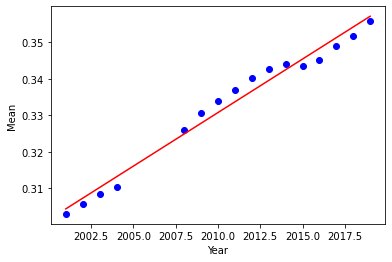

In [75]:
plt.scatter(train2[['year']], train2[['mean']],  color='blue')
plt.plot(train_x2, regr.coef_[0][0]*train_x2 + regr.intercept_[0], '-r')
plt.xlabel("Year")
plt.ylabel("Mean")

In [76]:
y_hat2= regr.predict(test2[['mean']])
x2 = np.asanyarray(test2[['year']])
y2 = np.asanyarray(test2[['mean']])
print("Residual sum of squares: %.2f"
      % np.mean((y_hat2 - y2) ** 2))

# Explained variance score: 1 is perfect prediction
print('Variance score: %.2f' % regr.score(x2, y2))

Residual sum of squares: 34.42
Variance score: 0.62


In [77]:
test_x2 = np.asanyarray(test2[['year']])
test_y2 = np.asanyarray(test2[['mean']])
test_y2_ = regr.predict(test_x2)

print("Mean absolute error: %.2f" % np.mean(np.absolute(test_y2_ - test_y2)))
print("Residual sum of squares (MSE): %.2f" % np.mean((test_y2_ - test_y2) ** 2))
print("R2-score: %.2f" % r2_score(test_y2 , test_y2_) )

Mean absolute error: 0.00
Residual sum of squares (MSE): 0.00
R2-score: 0.62


In [78]:
# Coefficient and intercept for predicting density of dwellings numbers in 2021
dregr = linear_model.LinearRegression()
densx = np.asanyarray(dentest1[['year']])
densy = np.asanyarray(dentest1[['mean']])
dregr.fit (densx, densy)
# The coefficients
print ('Coefficients: ', dregr.coef_)
print ('Intercept: ',dregr.intercept_)


dcoef = dregr.coef_
dintercept = dregr.intercept_

Coefficients:  [[0.00296597]]
Intercept:  [-5.6311474]


<h4> Average Rateable Value of Retail Space Data</h4>

In [79]:
lontest1.head()

,year,mean
0,2000.0,129.272727
1,2001.0,131.303030
2,2002.0,130.030303
3,2003.0,128.393939
4,2004.0,127.757576


In [80]:
#simple linear regression
msk3 = np.random.rand(len(lontest1)) < 0.8
train3 = lontest1[msk3]
test3 = lontest1[~msk3]

In [81]:
regr = linear_model.LinearRegression()
train_x3 = np.asanyarray(train3[['year']])
train_y3 = np.asanyarray(train3[['mean']])
regr.fit (train_x3, train_y3)
# The coefficients
print ('Coefficients: ', regr.coef_)
print ('Intercept: ',regr.intercept_)

Coefficients:  [[6.837015]]
Intercept:  [-13556.165]


Text(0, 0.5, 'Mean')

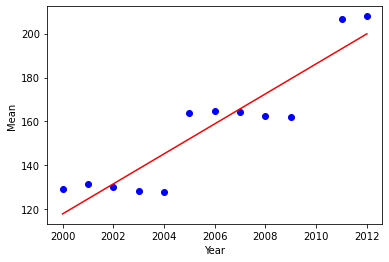

In [82]:
plt.scatter(train3[['year']], train3[['mean']],  color='blue')
plt.plot(train_x3, regr.coef_[0][0]*train_x3 + regr.intercept_[0], '-r')
plt.xlabel("Year")
plt.ylabel("Mean")

In [83]:
y_hat3= regr.predict(test3[['mean']])
x3 = np.asanyarray(test3[['year']])
y3 = np.asanyarray(test3[['mean']])
print("Residual sum of squares: %.2f"
      % np.mean((y_hat3 - y3) ** 2))

# Explained variance score: 1 is perfect prediction
print('Variance score: %.2f' % regr.score(x3, y3))

Residual sum of squares: 152588669.64
Variance score: nan


C:\Users\Asus\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


In [84]:
test_x3 = np.asanyarray(test3[['year']])
test_y3 = np.asanyarray(test3[['mean']])
test_y3_ = regr.predict(test_x3)

print("Mean absolute error: %.2f" % np.mean(np.absolute(test_y3_ - test_y3)))
print("Residual sum of squares (MSE): %.2f" % np.mean((test_y3_ - test_y3) ** 2))
print("R2-score: %.2f" % r2_score(test_y3 , test_y3_) )

Mean absolute error: 19.95
Residual sum of squares (MSE): 397.86
R2-score: nan


C:\Users\Asus\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:589: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


In [85]:
# Coefficient and intercept for predicting rateable value of floorspace numbers in 2021
rregr = linear_model.LinearRegression()
ratex = np.asanyarray(lontest1[['year']])
ratey = np.asanyarray(lontest1[['mean']])
rregr.fit (ratex, ratey)
# The coefficients
print ('Coefficients: ', rregr.coef_)
print ('Intercept: ',rregr.intercept_)

rcoef = rregr.coef_
rintercept = rregr.intercept_

Coefficients:  [[7.275392]]
Intercept:  [-14434.015]


<p><b>Vacant Dwelling Accuracy</b></p>
<p>The test values of the simple linear regression model have a very low mean absolute error and mean squared error. This means that the test values from the test accurately follow the trained model. However, the R2 score is negative 33.87. The R2 score is a measure of how much better the trained model is compared to the mean model when predicting the test points in the future.</p><p> A negative value tells us that our model is worse than the mean model. A highly negative number such as negative 33.87 tells us that the model we have used is a lot worse than the mean model. This could mean we have used the wrong machine learning model when trying to predict future values.</p>
<p>Since the scatter plot curve has the property of starting with slow declining mean, then rapidly declining mean and then slowly increasing mean again at the end, it is most similar to a non-linear curve called Sigmodial. However, since we are dealing with open system on a time series, it would be extremely difficult to use regression models to predict values without any more variables or data to fill in the blanks. In this project, we only have access to one x-variable (time) and one y-variable (vacant dwellings), therefore it is out of the scope of this capstone project to try to predict values without any more data.</p>
<br>
<p><b>Density of Dwellings Accuracy</b></p>
<p> The test values have a mean absolute error and mean squared error of zero. This means the test values are very accurate and follow the trained model. The R2 score is 0.97, this is almost perfect. This means that the trained model can be used to predict almost all of the test points. This shows that the trained model is much better than the mean model, therefore we have used the correct machine learning model for this data set.</p>
<br>
<p><b>Average Rateable Value of Retail Space Accuracy</b></p>
<p> The test values have a very high mean absolute error and mean squared error. This means that the test values do not accurately follow the trained model. You can see on the scatter/line plot that the points are not located tightly around the line. This means that when using this model, you need to take into account a wider variance in predicted values. The R2 score is 0.38, this is low albeit positive score. This means that the trained model can be used to predict the test points and that it is an improvement over the mean model, therefore we have used the correct machine learning model for this data set.</p>

<h3> Data Preparation - 2</h3>
<p> We will now do a second round of data preparation, which will conclude the modelling and evaluation stages for the time series portion of this project. This round of data preparation will prepare the data collected from the models exploration for the deployment stage. The time series data for 2021 will now be combined into a single combined column.</p>

<h4> Vacant Dwelling Data for 2021</h4>

In [86]:
#### The rough linear model to predict the new mean for vacant dwellings in 2021 is:
print ('vcoef= ', vregr.coef_)
print ('vintercept= ',vregr.intercept_)
vcoef = float(vcoef[0])
vintercept = float(vintercept[0])

vcoef=  [[-0.02202193]]
vintercept=  [44.799904]


<h4> Density of Dwellings Data for 2021</h4>

In [87]:
#### The rough linear model to predict the new mean for density of dwellings in 2021 is:
print ('dcoef= ', dregr.coef_)
print ('dintercept= ',dregr.intercept_)
dcoef = float(dcoef[0])
dintercept = float(dintercept[0])

dcoef=  [[0.00296597]]
dintercept=  [-5.6311474]


<h4> Average Rateable Value of Retail Space Data for 2021</h4>

In [88]:
#### The rough linear model to predict the new mean for rateable value of floorspace in 2021 is:
print ('rcoef= ', rregr.coef_)
print ('rintercept= ',rregr.intercept_)
rcoef = float(rcoef[0])
rintercept = float(rintercept[0])

rcoef=  [[7.275392]]
rintercept=  [-14434.015]


#### Vacant Dwellings

In [89]:
vacyfornewyear = vcoef*2021 + vintercept
vacyforlastyear = vactest1.iloc[15, 1]
vacydelta = ((vacyfornewyear-vacyforlastyear)/vacyforlastyear)
print("Percentage difference in mean from 2019 to 2021 for vacant dwellings: %.4f" % vacydelta)

Percentage difference in mean from 2019 to 2021 for vacant dwellings: -0.0546


In [90]:
vacdwell['2019'] = vacdwell['2019'].astype('float')
vacnewyear = vacdwell['2019'] * vacydelta
vacdwell['2021'] = vacdwell['2019'] + vacnewyear
vacdwell.head()

,Borough,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2021
0,City of London,165,123.0,93.0,122.0,98.0,72.0,131.0,88.0,89.0,107,120,86,124,252,321,311.0,294.033694
1,Barking and Dagenham,1623,1906.0,2477.0,2064.0,1650.0,1643.0,1570.0,1578.0,1631.0,1484,1382,1154,752,822,998,921.0,870.755729
2,Barnet,3607,3767.0,3486.0,3320.0,4036.0,3652.0,3679.0,3201.0,3016.0,2549,2362,2638,2199,2302,2367,2944.0,2783.392907
3,Bexley,2161,2157.0,2309.0,2247.0,2123.0,2059.0,1755.0,1971.0,2282.0,1271,1087,1180,1249,1469,1623,1668.0,1577.003862
4,Brent,3568,2764.0,2482.0,2736.0,2271.0,2268.0,2350.0,2370.0,2328.0,1130,1181,1073,968,1103,1126,1662.0,1571.331186


#### Density of Dwellings

In [91]:
denyfornewyear = dcoef*2021 + dintercept
denyforlastyear = dentest1.iloc[18, 1]
denydelta = ((denyfornewyear-denyforlastyear)/denyforlastyear)
print("Percentage difference in mean from 2019 to 2021 for density of dwellings: %.4f" % denydelta)

Percentage difference in mean from 2019 to 2021 for density of dwellings: 0.0205


In [92]:
densitydwell[2019] = densitydwell[2019].astype('float')
dennewyear = densitydwell[2019] * denydelta
densitydwell['2021'] = densitydwell[2019] + dennewyear
densitydwell.head()

,Borough,Total m2,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2021
0,City of London,3149383.0000000005,0.001590470260365284,0.0016247944438640839,0.0016276838987192093,0.0016712162350530247,0.001706492986086481,0.001706207215826084,0.0017065564905887915,0.0017211942783713506,0.00173583206615391,0.0017333236383126468,0.0017505016061876244,0.0017562170113955653,0.0017673302992998944,0.0019060876368482333,0.001977847724459045,0.002002296957848569,0.002004519615429435,0.00204833772202365,0.002066,0.002108
1,Barking and Dagenham,37799330.0,0.0018068574231342198,0.0018128813394311487,0.001821127517339593,0.001822759821404242,0.0018323287740814455,0.001839410910193382,0.0018475248106249503,0.0018664590086649683,0.0018740702546844088,0.0018769195115363158,0.0018804301557726025,0.0018897424901446666,0.001903128970804509,0.0019224679379237675,0.0019360660625466113,0.001955431485161245,0.0019711989604048537,0.001982125079994804,0.002006,0.002047
2,Barnet,86748314.00000001,0.0015045249179136781,0.00150781720091989,0.0015202969823713232,0.001531508727650891,0.001543573515446075,0.0015555460824287603,0.0015611669409505756,0.0015755948870660472,0.0015881438341268507,0.001597914629211122,0.0016063251673110327,0.0016307019578689285,0.0016465408824156349,0.0016593711029545609,0.0016746336474231488,0.0016914408905010947,0.0017121790457118116,0.0017376319899615406,0.001763,0.001799
3,Bexley,64285879.00000001,0.0014249785711104611,0.0014296701146452396,0.001434579435399802,0.0014458820731065992,0.0014500913956547127,0.001453398498292292,0.0014582611524997582,0.0014634349170212014,0.00146798646091469,0.0014746379994275258,0.0014783495454732756,0.0014815073151601458,0.0014880095207222724,0.0014962228330112743,0.0015088228007273572,0.0015067694726551065,0.0015186538866490413,0.0015229627644976278,0.001531,0.001562
4,Brent,43232637.00000001,0.002346074795298746,0.002378483181583395,0.0024020325200149136,0.0024160982824156666,0.0024308810956870383,0.002469604155767782,0.002497409538076523,0.0025220922794970844,0.0025500133151720537,0.0025770785159369295,0.0025925552494056744,0.002605508426423306,0.002620820932112006,0.002637798846274401,0.0026738595658645573,0.002698169903445862,0.0027297201417530925,0.002745772828985657,0.002786,0.002843


#### Average Rateable Value of Retail Space

In [93]:
rateyfornewyear = rcoef*2021 + rintercept
rateyforlastyear = lontest1.iloc[12, 1]
rateydelta = ((rateyfornewyear-rateyforlastyear)/rateyforlastyear)
print("Percentage difference in mean from 2012 to 2021 for rateable value of retail floorspace: %.4f" % rateydelta)

Percentage difference in mean from 2012 to 2021 for rateable value of retail floorspace: 0.2965


In [94]:
lonfloor
lonfloor['2012'] = lonfloor['2012'].astype('float')
ratenewyear = lonfloor['2012'] * rateydelta
lonfloor['2021'] = lonfloor['2012'] + ratenewyear
lonfloor.head()

,Borough,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2021
0,City of London,330.0,353.0,340.0,331.0,320.0,460.0,463.0,447.0,420.0,417.0,509.0,509.0,523.0,678.065876
1,Barking and Dagenham,84.0,84.0,84.0,85.0,85.0,103.0,103.0,105.0,103.0,103.0,137.0,139.0,137.0,177.619551
2,Barnet,152.0,151.0,149.0,149.0,148.0,181.0,182.0,184.0,184.0,183.0,239.0,240.0,241.0,312.454830
3,Bexley,97.0,97.0,98.0,96.0,96.0,118.0,117.0,116.0,116.0,116.0,137.0,139.0,143.0,185.398509
4,Brent,97.0,98.0,97.0,96.0,95.0,122.0,124.0,127.0,127.0,128.0,162.0,161.0,160.0,207.438891


#### Combined London Neighbourhood Data

##### How can we combine venue data from the Foursquare API with the dwelling and rateable value data?

<p> Here we can use a simple formula to combine the three data sets into one dataset, which we can add to the london neighbourhood dataset. The advantage of this is that our data set will be simplified however still able to give us insight into dwellings and rateable value. This simplified dataset will condense the three datasets of vacant dwellings, density of dwellings and average rateable value of retail space to give us a easy way of identifying the most efficient neighbourhoods which Amazon should be looking at for building their pharmacies.</p><br>
<p> The new dataset will have a formula defined as such:</p>

###### Dwellings Served per £ spent  in Average rateable value in the borough = (Density of Dwellings in the borough in dwellings per m2 - Density of Vacant Dwellings in the borough in dwellings per m2) / (Cost of Average Rateable Value of Retail Space in the borough in £ per m2)
<p> Dwellings served per £ spent in Average rateable value shows us how many dwellings a pharmacy is likely to serve if Amazon were to spend money within that borough. It acts as an efficiency metric. For example: </p> <br>
<p> Borough 1 = 100 dwellings per £100 spent on floorspace </p>
<p> Borough 2 = 200 dwellings per £100 spent on floorspace </p>
<p> Therefore, based on the data we have available, we can assume that spending on floorspace in Borough 2 is twice as efficient at reaching potential dwellings compared to Borough 1. Therefore, we can recommend Amazon to prioritise purchasing floorspace in Borough 2 first over floorspace in Borough 1.</p>

##### Why is this metric important to Amazon Pharmacies?
<p> Given that London is an expensive city to begin with and floorspace is limited, as well as, pharmacy deliveries need to be in a close proximity to dwellings, it is in Amazon's interest to secure locations where they are able to deliver to the most households as possible but at the most lowest prices possible.</p>

In [95]:
densitydwell['Total m2'] = densitydwell['Total m2'].astype('float')
vacdwell['vacdensity2021'] = vacdwell['2021'] / densitydwell['Total m2']
densitydwell['2021novac'] = densitydwell['2021'] - vacdwell['vacdensity2021']
lonfloor['2021efficiency'] = densitydwell['2021novac'] / lonfloor['2021']
lonfloor1 = lonfloor.drop(columns=['2000','2001','2002','2003','2004','2005','2006','2007','2008','2009','2010','2011','2012','2021'])
dflondon1 = pd.merge(dflondon, lonfloor1, on='Borough', right_index=True)
dflondon1.rename(columns={'2021efficiency':'Dwellings Per £'}, inplace=True)
dflondon1.reset_index(drop=True, inplace=True)

In [96]:
dflondon1.head()

,Borough,Total m2,Latitude,Longitude,Dwellings Per £
0,City of London,3149383.0000000005,51.515618,-0.091998,0.000003
1,Barking and Dagenham,37799330.0,51.554117,0.150504,0.000011
2,Barnet,86748314.00000001,51.653090,-0.200226,0.000006
3,Bexley,64285879.00000001,51.441679,0.150488,0.000008
4,Brent,43232637.00000001,51.563826,-0.275760,0.000014


<h3> Data Modelling & Evaluation - 2</h3>

<h4> K-Means clustering with the elbow curve method on Foursquare geospatial data</h4>

<p> In this section, we will carry out K-means clustering as a machine learning model on the geospatial data of retail venues provided by the Foursquare API. K-means will be used as a classification algorithm to identify the distinct segments of retail venues, separated by location. K-means clustering was chosen as it is a popular and simple algorithm to use to identify sub-groups within the data. It should be noted that other algorithms such as DB-SCAN could be more appropriate for geospatial data. However, K-means clustering  is a fast way to for pre-clustering, to get a rough idea of the general locations.</p>

<p> The K-means clustering algorithm will give Amazon an idea of where are ideal locations to look first when deciding to build their fulfillment centers. These will be described by the centroids of the K-means clusters. The centroids of the clusters show locations which are centrally located amongst the cluster. </p>

<p>The elbow curve method will be used to find the optimal number of centroid locations.</p>

In [97]:
london_venues.head()

,Borough,Borough Latitude,Borough Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,City of London,51.515618,-0.091998,Hawksmoor Guildhall,51.515498,-0.090849,Steakhouse
1,City of London,51.515618,-0.091998,Goodman Steak House Restaurant,51.514398,-0.090745,Steakhouse
2,City of London,51.515618,-0.091998,Daunt Books,51.513982,-0.092995,Bookstore
3,City of London,51.515618,-0.091998,The Ned Hotel,51.513755,-0.090067,Hotel
4,City of London,51.515618,-0.091998,The Merchant House,51.513264,-0.093039,Cocktail Bar


In [98]:
locations = london_venues[['Venue Latitude','Venue Longitude']]

In [99]:
locationlist = locations.values.tolist()

In [100]:
map_venues = folium.Map(location=[latitudelon, longitudelon], tiles='CartoDB Positron', zoom_start=11)

marker_cluster = folium.plugins.MarkerCluster().add_to(map_venues)

for point in range(0, len(locationlist)):
    folium.Marker(locationlist[point], popup=london_venues['Venue'][point], icon=folium.Icon(color='darkblue', icon_color='white', icon='male', angle=0, prefix='fa')).add_to(marker_cluster)

map_venues

#### Cluster Neighbourhoods

In [101]:
londonvenues = london_venues.loc[:, ['Venue','Venue Latitude','Venue Longitude']]

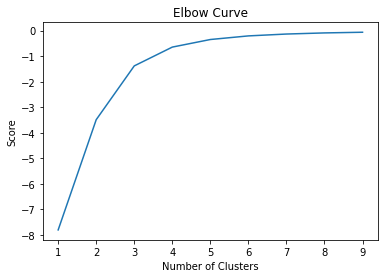

In [102]:
K_clusters = range(1,10)
kmeans = [KMeans(n_clusters=i) for i in K_clusters]
Y_axis = londonvenues[['Venue Latitude']]
X_axis = londonvenues[['Venue Longitude']]
score = [kmeans[i].fit(Y_axis).score(Y_axis) for i in range(len(kmeans))]

# Visualize
plt.plot(K_clusters, score)
plt.xlabel('Number of Clusters')
plt.ylabel('Score')
plt.title('Elbow Curve')
plt.show()

In [103]:
# By using the Elbow curve method to determine the optimal number of k-clusters, we find that k = 3 to 4 is the optimal amount of clusters.

In [104]:
# set number of clusters
kclusters = 4

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, init='k-means++')

kmeans.fit(londonvenues[londonvenues.columns[1:3]])

londonvenues['Cluster Label'] = kmeans.fit_predict(londonvenues[londonvenues.columns[1:3]])

centers = kmeans.cluster_centers_

labels = kmeans.predict(londonvenues[londonvenues.columns[1:3]])

londonvenues

,Venue,Venue Latitude,Venue Longitude,Cluster Label
0,Hawksmoor Guildhall,51.515498,-0.090849,1
1,Goodman Steak House Restaurant,51.514398,-0.090745,1
2,Daunt Books,51.513982,-0.092995,1
3,The Ned Hotel,51.513755,-0.090067,1
4,The Merchant House,51.513264,-0.093039,1
5,City Càphê,51.514750,-0.091545,1
6,Ned's Club Upstairs,51.513789,-0.090124,1
7,Ned's Club Downstairs,51.513622,-0.090145,1
8,M&S Simply Food,51.513590,-0.095297,1
9,Porterford Butchers,51.513032,-0.093737,1


In [105]:
#Find the centroids of the clusters
centroids = pd.DataFrame(centers, columns=['Latitude','Longitude'])


In [106]:
map_clusters = folium.Map(location=[latitudelon, longitudelon], tiles='CartoDB Positron', zoom_start=11)

# set color scheme for the clusters
x = np.arange(4)
ys = [i + x + (i*x)**2 for i in range(4)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lng, cluster in zip(londonvenues['Venue Latitude'], londonvenues['Venue Longitude'], londonvenues['Cluster Label']):
    
    #label clusters 
    folium.vector_layers.CircleMarker(
        [lat, lng],
        radius=1,
        #popup=label,
        tooltip = ' Cluster ' + str(cluster),
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.3).add_to(map_clusters)


# add centroids to the map
for lat, lng in zip(centroids['Latitude'], centroids['Longitude']):
    
    #label centroids
    folium.vector_layers.CircleMarker(
        [lat, lng],
        radius=7,
        #popup=label,
        tooltip = ' Centroid ',
        color='black',
        fill=True,
        fill_color='black',
        fill_opacity=1.0).add_to(map_clusters)    
       
map_clusters

In [107]:
lonvenues = pd.merge(london_venues, londonvenues, on='Venue', right_index=True)
lonvenues.drop(columns=['Venue Latitude_y','Venue Longitude_y'], inplace=True)
lonvenues.rename(columns={'Venue Latitude_x':'Venue Latitude','Venue Longitude_x':'Venue Longitude'}, inplace=True)

In [108]:
lonvenues.head()

,Borough,Borough Latitude,Borough Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,Cluster Label
0,City of London,51.515618,-0.091998,Hawksmoor Guildhall,51.515498,-0.090849,Steakhouse,1
1,City of London,51.515618,-0.091998,Goodman Steak House Restaurant,51.514398,-0.090745,Steakhouse,1
2,City of London,51.515618,-0.091998,Daunt Books,51.513982,-0.092995,Bookstore,1
3,City of London,51.515618,-0.091998,The Ned Hotel,51.513755,-0.090067,Hotel,1
4,City of London,51.515618,-0.091998,The Merchant House,51.513264,-0.093039,Cocktail Bar,1


In [109]:
dflondon1.head()

,Borough,Total m2,Latitude,Longitude,Dwellings Per £
0,City of London,3149383.0000000005,51.515618,-0.091998,0.000003
1,Barking and Dagenham,37799330.0,51.554117,0.150504,0.000011
2,Barnet,86748314.00000001,51.653090,-0.200226,0.000006
3,Bexley,64285879.00000001,51.441679,0.150488,0.000008
4,Brent,43232637.00000001,51.563826,-0.275760,0.000014


In [110]:
dflondon1['Dwellings Per £1m'] = dflondon1['Dwellings Per £'] * 1000000

In [111]:
dflondon1.head()

,Borough,Total m2,Latitude,Longitude,Dwellings Per £,Dwellings Per £1m
0,City of London,3149383.0000000005,51.515618,-0.091998,0.000003,2.971370
1,Barking and Dagenham,37799330.0,51.554117,0.150504,0.000011,11.396151
2,Barnet,86748314.00000001,51.653090,-0.200226,0.000006,5.655701
3,Bexley,64285879.00000001,51.441679,0.150488,0.000008,8.292218
4,Brent,43232637.00000001,51.563826,-0.275760,0.000014,13.530764


In [112]:
# Choropleth of Borough Dwellings served by £ Efficiency 

In [113]:
response = json.loads(requests.get("https://skgrange.github.io/www/data/london_boroughs.json").text)
    
print('GeoJSON file downloaded!')

GeoJSON file downloaded!


In [114]:
world_map = folium.Map(location=[latitudelon, longitudelon], zoom_start=11, tiles='Mapbox Bright')

In [115]:
# generate choropleth map using the total immigration of each country to Canada from 1980 to 2013
world_map.choropleth(
    geo_data=response,
    data=dflondon1,
    columns=['Borough', 'Dwellings Per £1m'],
    key_on='feature.properties.name',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Dwellings Served Per £1m Spent on Rateable Value of Floorspace'
)

# display map
world_map

C:\Users\Asus\anaconda3\lib\site-packages\folium\folium.py:411: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  warnings.warn(


In [116]:
# Combine the Cluster Map with the Choropleth Map

In [117]:
map_total = folium.Map(location=[latitudelon, longitudelon], tiles='CartoDB Positron', zoom_start=11)

map_total.choropleth(
    geo_data=response,
    data=dflondon1,
    columns=['Borough', 'Dwellings Per £1m'],
    key_on='feature.properties.name',
    fill_color='YlOrRd', 
    fill_opacity=0.5, 
    line_opacity=0.2,
    legend_name='Dwellings Served Per £1m Spent on Rateable Value of Floorspace'
)

# set color scheme for the clusters
x = np.arange(4)
ys = [i + x + (i*x)**2 for i in range(4)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lng, cluster in zip(londonvenues['Venue Latitude'], londonvenues['Venue Longitude'], londonvenues['Cluster Label']):
    
    #label clusters 
    folium.vector_layers.CircleMarker(
        [lat, lng],
        radius=1,
        #popup=label,
        tooltip = ' Cluster ' + str(cluster),
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=1.0).add_to(map_total)


# add centroids to the map
for lat, lng in zip(centroids['Latitude'], centroids['Longitude']):
    
    #label centroids
    folium.vector_layers.CircleMarker(
        [lat, lng],
        radius=7,
        #popup=label,
        tooltip = ' Centroid ',
        color='black',
        fill=True,
        fill_color='black',
        fill_opacity=1.0).add_to(map_total)    
       
map_total

<h4> Evaluation of K-means clustering</h4>
<p> The elbow curve method idenitified 4 distinct clusters from the venue location data. This method tells us that adding more than 4 clusters results in diminishing returns, whereby adding an additional cluster is no longer worth the cost. When input into the K-means algorithm, we can see the 4 clusters separated by colour in different boroughs of London.</p>

<p> The black dots amongst the clusters identify the locations of the centroids, which are the most central locations with respect to other venue locations within the cluster.</p>

<h4> Evaluation of efficiency of retail space</h4>
<p> From looking at the choropleth map generated, we can see where are the most efficient boroughs to spend on retail space. Efficiency here is described as "how many consumer dwellings can be served per £ spent on commercial retail space within that borough". For example in the borough of Hackney in the Red Cluster 0, we can see the highest efficiency. Please bare in mind that average rateable value of retail space is not the actual amount of money to be spent, rateable value is described as a reference value based on its size, location, and other factors, used to determine the real rates payable by its owner. To find the real estimate of the cost of retail space, the Amazon will receive its own multiplier from the local authorities, which is then multiplied by rateable value. Therefore, this choropleth maps gives a rough idea of the efficiencies you can expect within each borough.</p>

<h3>Recommendations</h3>
<p> The goal for Amazon here is to get insight on which locations would be the most ideal locations for their first fulfillment centers. These fulfillment centers require locations which allow highly custom, unpredictable and same-day deliveries, as this is the general nature of the retail pharmacy market. Orders come in smaller, more personalised volumes and as well as being needed almost immediately. A secondary goal is to get insight on which locations would be capable of giving a better return on investment as the London real estate market is extremely competitively priced.</p>


<h4>How to use this model - Insights</h4>
<h5> Smaller multi-coloured dots - Locations of high traffic congestion</h5>
<p> The smaller different colours dots represent the locations of the most densely situated commercial venues. It can be assumed that these locations have the most traffic congestion and it may be ideal to avoid purchasing fulfillment centers in these locations of high traffic.</p>

<h5> The 4 separate coloured clusters - Diminishing returns after 4 segments of locations</h5>
<p> There are only 4 different coloured clusters here as segmenting the venues any more than 4 clusters would result in diminishing returns. This means it would not be worth spending on a 5th different cluster, as it would already be served adequately by only 4 clusters.</p>

<h5> Larger black dots - Rough optimal locations for your first 4 fulfillment centers</h5>
<p> These could be ideal locations for the fulfillment centers for being somewhat distant to the mass of venues, meaning they are less susceptible traffic congestion. Howevever also being more equidistant to all other locations in the cluster, giving delivery drivers flexibility when trying to find routes through the city, as well as returning back to the fulfillment center for pickups.</p>

<h5> Coloured heat map - Areas of potentially higher return on investment</h5>
<p> Spending on boroughs with more Red means that those fulfillment centers are potentially able to serve more consumer dwellings(homes) per £ spent than any other boroughs. The more yellow, the less efficient your £'s will be at serving consumers, in terms of reach. For example, in Hackney, you will be able to serve the most customers per £ spent compared to any other borough in London.</p>

<h4> Suggestion</h4>
<p> Based on this model, we suggest to purchase 4 fulfillment center locations. Three locations will be Brentford, Fulham and Catford South. For the fourth location, we suggest either Barnsbury Park Road or Ballspond Road in Dalston. The fourth location centroid is near Hackney, which has the highest dwellings served by £ compared to any other borough, so it could be worth purchasing a fulfillment center there instead of in Barnsbury Park Road.</p>

<h3> Conclusion</h3>


<p>In 2021 Amazon will be looking at possible commercial locations in London to purchase to build fulfillment centers for their new Amazon Pharmacy marketplace. Pharmacy deliveries are more personalised and last-minute, therefore the locations need optimal flexibility for delivery drivers and to reach the majority of consumer dwellings efficiently.</p>

<p>The whole of London could be served by 4 fulfillment centers placed in key positions. East London is more economic in terms of property costs, however locations in the West and South will be needed to minimise delivery times. Central and North West London are by far the worst locations in terms of return on investment. Therefore, 4 centers in these locations will offer the most "bang for buck".
    
<h5>Further Work</h5>
<p>The model is limited by the free data sets online, however, if more data becomes available, it can be fed through this model to get more accurate results.</p>

<p> This model looks at the broad implications of the data, further granularity can be achieved by assessing each borough on the neighbourhood level.</p>

<p> The retail value predictions could be further improved by more economic data on the retail locations. This would give more accurate estimations of the prices of prospective venues.</p>

<p> Traffic congestion data could be used to add a further layer on top of the existing model to give more insight on locations.</p>

<p> Instead of using venue locations to find the centroids of the clusters i.e. the optimal fulfillment center locations, dwelling locations could be used to do the same thing. This would give fulfillment center locations optimally located to dwellings instead of retail venues.</p>

In [118]:
lonfloor.shape

(33, 16)

In [119]:
vacdwell.shape

(33, 19)

In [120]:
densitydwell.shape

(33, 23)

In [121]:
lonvenues.shape

(6657, 8)

In [122]:
dflondon1.shape

(33, 6)

In [123]:
londonvenues.shape

(1953, 4)

In [124]:
lonvenues

,Borough,Borough Latitude,Borough Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,Cluster Label
0,City of London,51.515618,-0.091998,Hawksmoor Guildhall,51.515498,-0.090849,Steakhouse,1
1,City of London,51.515618,-0.091998,Goodman Steak House Restaurant,51.514398,-0.090745,Steakhouse,1
2,City of London,51.515618,-0.091998,Daunt Books,51.513982,-0.092995,Bookstore,1
3,City of London,51.515618,-0.091998,The Ned Hotel,51.513755,-0.090067,Hotel,1
4,City of London,51.515618,-0.091998,The Merchant House,51.513264,-0.093039,Cocktail Bar,1
5,City of London,51.515618,-0.091998,City Càphê,51.514750,-0.091545,Vietnamese Restaurant,1
6,City of London,51.515618,-0.091998,Ned's Club Upstairs,51.513789,-0.090124,Roof Deck,1
7,City of London,51.515618,-0.091998,Ned's Club Downstairs,51.513622,-0.090145,Lounge,1
8,City of London,51.515618,-0.091998,M&S Simply Food,51.513590,-0.095297,Grocery Store,1
8,City of London,51.515618,-0.091998,M&S Simply Food,51.513590,-0.095297,Grocery Store,3


In [125]:
dflondon1

,Borough,Total m2,Latitude,Longitude,Dwellings Per £,Dwellings Per £1m
0,City of London,3149383.0000000005,51.515618,-0.091998,0.000003,2.971370
1,Barking and Dagenham,37799330.0,51.554117,0.150504,0.000011,11.396151
2,Barnet,86748314.00000001,51.653090,-0.200226,0.000006,5.655701
3,Bexley,64285879.00000001,51.441679,0.150488,0.000008,8.292218
4,Brent,43232637.00000001,51.563826,-0.275760,0.000014,13.530764
5,Bromley,150134892.00000003,51.402805,0.014814,0.000004,4.458311
6,Camden,21789295.000000004,51.542305,-0.139560,0.000012,11.848432
7,Croydon,86503635.0,51.371305,-0.101957,0.000010,9.756849
8,Ealing,55544305.00000001,51.512655,-0.305195,0.000011,10.640378
9,Enfield,82201119.99999999,51.652085,-0.081018,0.000007,7.071540


In [126]:
london_venues.shape

(1953, 7)